# Physics Loss Investigation Adaptive Physics - Two Stages Approach.

In [1]:
import numpy as np
import pandas as pd
import torch
import torch.optim as optim
import os
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler

import pvlib
from pvlib import location, pvsystem, modelchain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS
import re


In [32]:
# -----------------------------------------------------------------------------
# 1. Data Loading & Generation (Same as Mamba)
# -----------------------------------------------------------------------------


import pandas as pd
import re
import numpy as np
from pvlib import location, pvsystem, modelchain
from pvlib.modelchain import ModelChain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS

def get_station_metadata(station_num, df):
    """
    Retrieves and parses metadata for a specific station from the DataFrame.
    
    Args:
        station_num (int or str): The station number (e.g., 5 or '05').
        df (pd.DataFrame): The source dataframe containing station metadata.
        
    Returns:
        dict: A clean dictionary with numerical values ready for simulation.
    """
    
    # 1. Format the station ID
    station_id_str = f"station{str(station_num).zfill(2)}"
    
    # 2. Filter the dataframe
    station_row = df[df['Station_ID'] == station_id_str]
    
    if station_row.empty:
        raise ValueError(f"Station ID {station_id_str} not found in DataFrame.")
    
    # Get the single row as a Series
    row = station_row.iloc[0]

    # --- Helper 1: Parse "Key:Value" blocks (lines separated by \n) ---
    def parse_kv_string(text_block):
        data = {}
        if isinstance(text_block, str):
            for item in text_block.split('\n'):
                if ':' in item:
                    k, v = item.split(':', 1)
                    data[k.strip()] = v.strip()
        return data

    # --- Helper 2: Extract numeric values safely (e.g., "250 Wp" -> 250.0) ---
    def extract_num(val, default=0.0):
        if pd.isna(val): return default
        match = re.search(r"[-+]?\d*\.\d+|\d+", str(val))
        return float(match.group()) if match else default

    # 3. Parse complex text columns into dictionaries
    module_items = parse_kv_string(row.get('Module', ''))
    inverter_items = parse_kv_string(row.get('Inverters', ''))
    layout_items = parse_kv_string(row.get('Layout', ''))

    # 4. Build the final clean dictionary
    # We use extract_num to ensure we pass numbers (floats/ints) to the model, not strings.
    metadata = {
        # --- Identity & Location ---
        'Station_ID': station_id_str,
        'Longitude': float(row['Longitude']),
        'Latitude': float(row['Latitude']),
        'Array_Tilt': row['Array_Tilt'], # Kept as string (e.g., "South 30") for parsing in main model
        
        # --- System Capacity & Dimensions ---
        'Capacity': float(row['Capacity']),          # Total Station Capacity (kW)
        'Panel_Size': float(row.get('Panel_Size', 1.62)), # Panel Area in m^2
        'Total_Panel_Number': int(row.get('Panel_Number', 0)),
        'PV_Technology': row['PV_Technology'],

        # --- Extracted Module Specs (Cleaned to Float) ---
        'Module_Pmax': extract_num(module_items.get('Pmax'), default=250),
        'Module_Vmpp': extract_num(module_items.get('Vmpp'), default=30),
        'Module_Impp': extract_num(module_items.get('Impp'), default=8),
        
        # --- Extracted Inverter Specs (Cleaned to Float) ---
        'Inverter_Rated_Power': extract_num(inverter_items.get('Rated power'), default=500),
        'Inverter_Max_DC_Voltage': extract_num(inverter_items.get('Max. DC voltage'), default=1000),
        
        # --- Extracted Layout Specs (Cleaned to Int) ---
        # Note: Layout strings can look like "modules per string:20"
        'Modules_per_String': int(extract_num(layout_items.get('modules per string'), default=20)),
        'Strings_per_Inverter': int(extract_num(layout_items.get('strings per inverter'), default=100)),
    }
    
    return metadata


# def calculate_clearsky_indices(metadata, df):
#     """
#     Calculates both Irradiance (K_CS) and Power (K_PV) Clear Sky Indices.
    
#     Args:
#         metadata (dict): Parsed station metadata.
#         df (pd.DataFrame): Time-series data with 'lmd_totalirrad' and 'power' columns.
#                            'power' should be in MW (or kW, logic adapts).
#                            'lmd_totalirrad' should be in W/m^2.
    
#     Returns:
#         pd.DataFrame: Original df with added columns 'GHI_clr', 'K_CS', 'P_CLR', 'K_PV'.
#     """
    
#     print(f"--- Processing {metadata.get('Station_ID', 'Unknown')} ---")
    
#     # ---------------------------------------------------------
#     # 1. SETUP LOCATION & TIME
#     # ---------------------------------------------------------
#     # The paper explicitly states timestamps are in Coordinated Universal Time (UTC).
#     # Setting tz='UTC' ensures pvlib aligns Solar Noon correctly (approx 04:00 UTC for China).
#     lat = metadata['Latitude']
#     lon = metadata['Longitude']
    
#     site = location.Location(lat, lon, tz='UTC')
    
#     # Ensure index is Datetime
#     if not isinstance(df.index, pd.DatetimeIndex):
#         df['date_time'] = pd.to_datetime(df['date_time'])
#         df.set_index('date_time', inplace=True)

#     # ---------------------------------------------------------
#     # 2. CALCULATE CLEAR SKY IRRADIANCE (GHI_clr)
#     # ---------------------------------------------------------
#     print("Calculating Clear Sky Irradiance (Ineichen model)...")
    
#     # Calculate theoretical GHI (returns W/m^2)
#     cs = site.get_clearsky(df.index, model='ineichen')
#     df['GHI_clr'] = cs['ghi']

#     # --- Index 1: Irradiance Clear Sky Index (K_CS) ---
#     # Formula: K_CS = Measured GHI / Clear Sky GHI
    
#     if 'lmd_totalirrad' in df.columns:
#         # Standardize Measured Units: 
#         # lmd_totalirrad is W/m^2.
#         meas_ghi = df['lmd_totalirrad']
        

#         # Calculate Index (Filter: Only when model expects sun > 10 W/m^2)
#         # Naive filter to avoid night time noise
#         df['K_CS_day'] = np.where(
#             df['GHI_clr'] > 10, 
#             meas_ghi / df['GHI_clr'], 
#             0.0
#         )
#         df['K_CS_dayNight'] = meas_ghi / df['GHI_clr']

#         df['K_CS'] = df['K_CS_day']
        
#         # Clip outliers (cloud edge effects can cause > 1.0)
#         df['K_CS'] = df['K_CS'].clip(lower=0.0, upper=1.25)
#     else:
#         print("Warning: 'lmd_totalirrad' column missing. K_CS not calculated.")

#     # ---------------------------------------------------------
#     # 3. SETUP PV SYSTEM MODEL (For P_CLR)
#     # ---------------------------------------------------------
#     # Extract Tilt safely from string 
#     try:
#         tilt_str = str(metadata.get('Array_Tilt'))
#         tilt_match = re.search(r"[\d.]+", tilt_str)
#         tilt = float(tilt_match.group()) if tilt_match else 33.0
#     except Exception as e:
#         print(f"Error extracting tilt: {e} .... Assuming 33 degrees")
#         tilt = 33.0
    
#     # Default Azimuth: 180 (South) for Northern Hemisphere
#     azimuth = 180 

#     # Define Module Parameters (Generic Poly-Si based on metadata)
#     # Hard coded Module for specific station 07
#     module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
#     # Module Parameters can be retreived from pvsystem.retrieve_sam by defining the module name and for now for simplicity we use hardcoded one.
#     # module_params = {
#     #     'pdc0': metadata['Module_Pmax'],   # STC Power (Watts)
#     #     'gamma_pdc': -0.004,               # Temp coeff
#     #     'b': 0.05, 'a': -3.56              # Sandia model defaults
#     # }
    
#     # Define Inverter Parameters (One Block)
#     # Block Size = Modules per string * Strings per inverter * Module Power
#     block_dc_watts = (metadata['Modules_per_String'] * metadata['Strings_per_Inverter'] * metadata['Module_Pmax'])
    

#     # The same with Inverter infoirmation i used hardcoded info for station 07    
#     # inv_params = pvsystem.retrieve_sam("cecinverter")

#     ivt_para = pvsystem.retrieve_sam('cecinverter')['Advanced_Energy_Industries__Solaron_500kW__3159500_XXXX___480V_']
#     ivt_para["Pdco"], ivt_para['Vdco'], ivt_para["Vdcmax"], ivt_para['Idcmax'], = 567000, 315, 1000, 1134
#     ivt_para["Mppt_low"], ivt_para['Mppt_high'] = 460, 950
#     inverter_parameters = ivt_para
    
#     # Temperature Model (Open Rack)
#     temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
#     system = pvsystem.PVSystem(
#         surface_tilt=tilt,
#         surface_azimuth=azimuth,
#         module_parameters=module_params,
#         inverter_parameters=inverter_parameters,
#         temperature_model_parameters=temp_model,
#         modules_per_string=metadata['Modules_per_String'],
#         strings_per_inverter=metadata['Strings_per_Inverter']
#         # modules_per_string=20, strings_per_inverter=100 # Must be retreived from metadata, but for now hardcoded
#     )

#     # ---------------------------------------------------------
#     # 4. RUN MODEL CHAIN FOR POWER
#     # ---------------------------------------------------------
#     print("Running PV Power Simulation...")

#     mc = ModelChain(system, site, transposition_model='perez',
#                         solar_position_method='nrel_numpy',
#                         aoi_model='physical', spectral_model='no_loss')

#     # mc = modelchain.ModelChain(
#     #     system, 
#     #     site, 
#     #     aoi_model='physical', 
#     #     spectral_model='no_loss', 
#     #     ac_model='pvwatts'
#     # )

#     # Run using the Clear Sky weather data
#     mc.run_model(cs)

#     # ---------------------------------------------------------
#     # 5. SCALE & CALCULATE POWER INDEX (K_PV)
#     # ---------------------------------------------------------
#     # The simulation (mc.results.ac) is for ONE Block. Scale to full station.
    
#     station_total_capacity_watts = metadata['Capacity'] * 1000  # kW -> Watts [cite: 109]
#     scaling_factor = station_total_capacity_watts / block_dc_watts
    
#     # Calculate Station Clear Sky Power (MW)
#     # FillNa(0) handles night time; Divide by 1M to get MW
#     p_clr_watts = mc.results.ac.fillna(0) * scaling_factor
#     df['P_CLR'] = p_clr_watts / 1_000_000 

#     # --- Index 2: Power Clear Sky Index (K_PV) ---
#     # Formula: K_PV = Measured Power / Clear Sky Power
    
#     if 'power' in df.columns:
#         meas_power = df['power']
        
#         # Check units: Paper says Power is MW[cite: 109].
#         # Heuristic: If max > 500, it is likely kW, so divide by 1000.
#         if meas_power.max() > 500:
#             meas_power = meas_power / 1000.0
            
#         # Calculate Index
#         # Filter: Only calculate when model expects > 0.05 MW to avoid night noise
#         df['K_PV'] = np.where(
#             df['P_CLR'] > 1.0, 
#             meas_power / df['P_CLR'], 
#             0.0
#         )
        
#         # Clip for cleanliness (Values > 1.0 mean better than clear sky or model error)
#         df['K_PV'] = df['K_PV'].clip(lower=0.0, upper=1.5)
#     else:
#         print("Warning: 'power' column missing. K_PV not calculated.")

#     return df

def calculate_clearsky_indices(metadata, df):
    """
    Calculates both Irradiance (K_CS) and Power (K_PV) Clear Sky Indices.
    Includes fixes for UTC localization and strict CSV parsing.
    """
    
    print(f"--- Processing {metadata.get('Station_ID', 'Unknown')} ---")
    
    # ---------------------------------------------------------
    # 1. SETUP LOCATION & TIME
    # ---------------------------------------------------------
    # The paper explicitly states timestamps are in Coordinated Universal Time (UTC).
    lat = metadata['Latitude']
    lon = metadata['Longitude']
    
    site = location.Location(lat, lon, tz='UTC')
    
    # --- FIX: Ensure index is Datetime and Localized to UTC ---
    if not isinstance(df.index, pd.DatetimeIndex):
        # FIX: Explicit format '%Y-%m-%d %H:%M' as stated in paper
        df['date_time'] = pd.to_datetime(df['date_time'], format='%Y-%m-%d %H:%M', errors='coerce')
        df.set_index('date_time', inplace=True)
        
        # FIX: Explicitly localize to UTC
        df.index = df.index.tz_localize('UTC')
    elif df.index.tz is None:
        # If it is a DatetimeIndex but naive, localize it
        df.index = df.index.tz_localize('UTC')
        
    # ---------------------------------------------------------
    # 2. CALCULATE CLEAR SKY IRRADIANCE (GHI_clr)
    # ---------------------------------------------------------
    print("Calculating Clear Sky Irradiance (Ineichen model)...")
    
    # Calculate theoretical GHI (returns W/m^2)
    # Note: pvlib handles UTC index correctly if site tz is UTC
    cs = site.get_clearsky(df.index, model='ineichen')
    df['GHI_clr'] = cs['ghi']

    # --- Index 1: Irradiance Clear Sky Index (K_CS) ---
    # Formula: K_CS = Measured GHI / Clear Sky GHI
    
    if 'lmd_totalirrad' in df.columns:
        # Standardize Measured Units: 
        # lmd_totalirrad is W/m^2.
        meas_ghi = df['lmd_totalirrad']
        
        # Calculate Index (Filter: Only when model expects sun > 10 W/m^2)
        # Naive filter to avoid night time noise
        df['K_CS_day'] = np.where(
            df['GHI_clr'] > 10, 
            meas_ghi / df['GHI_clr'], 
            0.0
        )
        df['K_CS_dayNight'] = meas_ghi / df['GHI_clr']
        df['K_CS'] = df['K_CS_day']
        
        # Clip outliers (cloud edge effects can cause > 1.0)
        df['K_CS'] = df['K_CS'].clip(lower=0.0, upper=1.25)
    else:
        print("Warning: 'lmd_totalirrad' column missing. K_CS not calculated.")

    # ---------------------------------------------------------
    # 3. SETUP PV SYSTEM MODEL (For P_CLR)
    # ---------------------------------------------------------
    # Extract Tilt safely from string 
    try:
        tilt_str = str(metadata.get('Array_Tilt'))
        tilt_match = re.search(r"[\d.]+", tilt_str)
        tilt = float(tilt_match.group()) if tilt_match else 33.0
    except Exception as e:
        print(f"Error extracting tilt: {e} .... Assuming 33 degrees")
        tilt = 33.0
    
    # Default Azimuth: 180 (South) for Northern Hemisphere
    azimuth = 180 

    # Define Module Parameters
    module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    
    # Define Inverter Parameters (One Block)
    block_dc_watts = (metadata['Modules_per_String'] * metadata['Strings_per_Inverter'] * metadata['Module_Pmax'])
    
    ivt_para = pvsystem.retrieve_sam('cecinverter')['Advanced_Energy_Industries__Solaron_500kW__3159500_XXXX___480V_']
    ivt_para["Pdco"], ivt_para['Vdco'], ivt_para["Vdcmax"], ivt_para['Idcmax'] = 567000, 315, 1000, 1134
    ivt_para["Mppt_low"], ivt_para['Mppt_high'] = 460, 950
    inverter_parameters = ivt_para
    
    # Temperature Model (Open Rack)
    temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
    system = pvsystem.PVSystem(
        surface_tilt=tilt,
        surface_azimuth=azimuth,
        module_parameters=module_params,
        inverter_parameters=inverter_parameters,
        temperature_model_parameters=temp_model,
        modules_per_string=metadata['Modules_per_String'],
        strings_per_inverter=metadata['Strings_per_Inverter']
    )

    # ---------------------------------------------------------
    # 4. RUN MODEL CHAIN FOR POWER
    # ---------------------------------------------------------
    print("Running PV Power Simulation...")

    mc = ModelChain(system, site, transposition_model='perez',
                        solar_position_method='nrel_numpy',
                        aoi_model='physical', spectral_model='no_loss')

    mc.run_model(cs)

    # ---------------------------------------------------------
    # 5. SCALE & CALCULATE POWER INDEX (K_PV)
    # ---------------------------------------------------------
    station_total_capacity_watts = metadata['Capacity'] * 1000  # kW -> Watts
    scaling_factor = station_total_capacity_watts / block_dc_watts
    
    # Calculate Station Clear Sky Power (MW)
    p_clr_watts = mc.results.ac.fillna(0) * scaling_factor
    df['P_CLR'] = p_clr_watts / 1_000_000 

    # --- Index 2: Power Clear Sky Index (K_PV) ---
    if 'power' in df.columns:
        meas_power = df['power']
        
        # Check units: Paper says Power is MW.
        if meas_power.max() > 500:
            meas_power = meas_power / 1000.0
            
        # Calculate Index
        df['K_PV'] = np.where(
            df['P_CLR'] > 1.0, 
            meas_power / df['P_CLR'], 
            0.0
        )
        
        # Clip for cleanliness
        df['K_PV'] = df['K_PV'].clip(lower=0.0, upper=1.5)
    else:
        print("Warning: 'power' column missing. K_PV not calculated.")

    return df


# def calculate_nwp_power(metadata, df):
#     """
#     Calculates the expected PV Power output (MW) based purely on NWP Weather Forecasts.
#     This acts as a "Physics-Based Baseline" to compare against the AI model.
    
#     Args:
#         metadata (dict): Station metadata from get_station_metadata()
#         df (pd.DataFrame): DataFrame containing 'nwp_' columns.
        
#     Returns:
#         pd.Series: The calculated power in MW, aligned with df.index.
#     """
#     station_id = metadata.get('Station_ID', 'Unknown')
#     print(f"--- Calculating NWP Physical Power for {station_id} ---")
    
#     # ---------------------------------------------------------
#     # 1. SETUP LOCATION & TIME
#     # ---------------------------------------------------------
#     lat = metadata['Latitude']
#     lon = metadata['Longitude']
    
#     # Define Location (UTC to align with solar position)
#     site = location.Location(lat, lon, tz='UTC')
    
#     # Ensure DataFrame index is Datetime
#     if not isinstance(df.index, pd.DatetimeIndex):
#         df.index = pd.to_datetime(df.index)

#     # ---------------------------------------------------------
#     # 2. PREPARE WEATHER DATA (Map NWP -> PVLib Standard)
#     # ---------------------------------------------------------
#     # PVLib ModelChain expects columns: 'ghi', 'dni', 'dhi', 'temp_air', 'wind_speed', 'pressure'
#     weather_nwp = pd.DataFrame(index=df.index)
    
#     # Map available columns
#     weather_nwp['ghi'] = df['nwp_globalirrad']
#     weather_nwp['dni'] = df['nwp_directirrad']
#     weather_nwp['temp_air'] = df['nwp_temperature']
#     weather_nwp['wind_speed'] = df['nwp_windspeed']
    
#     # Handle Pressure (Default to 101325 Pa if missing)
#     if 'nwp_pressure' in df.columns:
#         # Assumption: NWP pressure is often hPa, PVLib expects Pa. 
#         # If your data is already Pa, remove the * 100.
#         weather_nwp['pressure'] = df['nwp_pressure'] * 100 
#     else:
#         weather_nwp['pressure'] = 101325.0

#     # CALCULATE MISSING DHI (Diffuse Horizontal Irradiance)
#     # Physics Relation: GHI = DNI * cos(Zenith) + DHI
#     # Therefore: DHI = GHI - (DNI * cos(Zenith))
    
#     # Get Solar Position (Zenith) for every timestamp
#     solpos = site.get_solarposition(weather_nwp.index)
#     zenith_rad = np.radians(solpos['zenith'])
    
#     # Calculate DHI
#     weather_nwp['dhi'] = weather_nwp['ghi'] - (weather_nwp['dni'] * np.cos(zenith_rad))
    
#     # Physics Check: Irradiance cannot be negative.
#     # (Negative values happen when Sun is low and NWP GHI/DNI are slightly mismatched)
#     weather_nwp['dhi'] = weather_nwp['dhi'].clip(lower=0.0)
#     weather_nwp['dni'] = weather_nwp['dni'].clip(lower=0.0)
#     weather_nwp['ghi'] = weather_nwp['ghi'].clip(lower=0.0)

#     # ---------------------------------------------------------
#     # 3. DEFINE PV SYSTEM (Hardware Specs)
#     # ---------------------------------------------------------
#     # Extract Tilt
#     try:
#         tilt_str = str(metadata.get('Array_Tilt'))
#         tilt_match = re.search(r"[\d.]+", tilt_str)
#         tilt = float(tilt_match.group()) if tilt_match else 33.0
#     except:
#         tilt = 33.0
        
#     # Hardcoded/Standardized Equipment (Matching your previous Setup)
#     # Module: Yingli YL250P-29b
#     module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    
#     # Inverter: Advanced Energy 500kW
#     ivt_para = pvsystem.retrieve_sam('cecinverter')['Advanced_Energy_Industries__Solaron_500kW__3159500_XXXX___480V_']
#     # Override generic params with specific constraints if needed
#     ivt_para["Pdco"], ivt_para['Vdco'], ivt_para["Vdcmax"], ivt_para['Idcmax'] = 567000, 315, 1000, 1134
#     ivt_para["Mppt_low"], ivt_para['Mppt_high'] = 460, 950
    
#     # Temp Model
#     temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
#     # Create the System Object
#     system = pvsystem.PVSystem(
#         surface_tilt=tilt,
#         surface_azimuth=180, # Facing South
#         module_parameters=module_params,
#         inverter_parameters=ivt_para,
#         temperature_model_parameters=temp_model,
#         modules_per_string=metadata['Modules_per_String'],
#         strings_per_inverter=metadata['Strings_per_Inverter']
#     )

#     # ---------------------------------------------------------
#     # 4. RUN PHYSICAL SIMULATION (ModelChain)
#     # ---------------------------------------------------------
#     print("Running ModelChain with NWP Weather...")
    
#     mc = ModelChain(system, site, 
#                     transposition_model='perez',
#                     solar_position_method='nrel_numpy',
#                     aoi_model='physical', 
#                     spectral_model='no_loss')

#     # Run the simulation using the PREPARED NWP weather
#     mc.run_model(weather_nwp)
    
#     # ---------------------------------------------------------
#     # 5. SCALE TO FULL STATION CAPACITY
#     # ---------------------------------------------------------
#     # The simulation result (mc.results.ac) is for ONE "Inverter Block" defined above.
#     # We must scale this up to match the total Station Capacity.
    
#     # Calculate DC Watts of one defined block
#     block_dc_watts = (metadata['Modules_per_String'] * metadata['Strings_per_Inverter'] * metadata['Module_Pmax'])
    
#     # Get Total Station Capacity in Watts (Capacity is usually in kW in metadata)
#     station_total_capacity_watts = metadata['Capacity'] * 1000
    
#     # Scaling Factor
#     if block_dc_watts > 0:
#         scaling_factor = station_total_capacity_watts / block_dc_watts
#     else:
#         scaling_factor = 1.0 # Fallback to avoid div/0
        
#     # Get AC Power, fill NaNs (night), scale, and convert to MW
#     # result is in Watts -> divide by 1,000,000 for MW
#     nwp_power_mw = (mc.results.ac.fillna(0) * scaling_factor) / 1_000_000
    
#     # Final Clip (Power cannot be negative)
#     nwp_power_mw = nwp_power_mw.clip(lower=0.0)
    
#     print(f"Done. Mean Predicted Power: {nwp_power_mw.mean():.4f} MW")
    
#     return nwp_power_mw


import pandas as pd
import re
import numpy as np
from pvlib import location, pvsystem, modelchain
from pvlib.modelchain import ModelChain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS

def calculate_nwp_power(metadata, df):
    """
    Calculates the expected PV Power output (MW) based purely on NWP Weather Forecasts.
    This function now also calculates the Sun's elevation angle to enforce time-based boundaries.
    
    Args:
        metadata (dict): Station metadata from get_station_metadata()
        df (pd.DataFrame): DataFrame containing 'nwp_' columns.
        
    Returns:
        pd.DataFrame: The input dataframe enriched with 'NWP_Power_MW' and 'sun_elevation'.
    """
    station_id = metadata.get('Station_ID', 'Unknown')
    print(f"--- Calculating NWP Physical Power & Sun Elevation for {station_id} ---")
    
    # ---------------------------------------------------------
    # 1. SETUP LOCATION & TIME
    # ---------------------------------------------------------
    lat = metadata['Latitude']
    lon = metadata['Longitude']
    
    # Define Location (UTC to align with solar position)
    site = location.Location(lat, lon, tz='UTC')
    
    # Ensure DataFrame index is Datetime
    if not isinstance(df.index, pd.DatetimeIndex):
        df.index = pd.to_datetime(df.index)

    # ---------------------------------------------------------
    # 2. NEW: CALCULATE SUN ELEVATION
    # ---------------------------------------------------------
    # We need solar position to get elevation (degrees above horizon)
    solpos = site.get_solarposition(df.index)
    
    # Elevation is the angle of the sun (0 deg at horizon, 90 deg at zenith)
    # This will be used as a time-based boundary constraint mask.
    df['sun_elevation'] = solpos['elevation']

    # ---------------------------------------------------------
    # 3. PREPARE WEATHER DATA (Map NWP -> PVLib Standard)
    # ---------------------------------------------------------
    # PVLib ModelChain expects columns: 'ghi', 'dni', 'dhi', 'temp_air', 'wind_speed', 'pressure'
    weather_nwp = pd.DataFrame(index=df.index)
    
    # Map available columns
    weather_nwp['ghi'] = df['nwp_globalirrad']
    weather_nwp['dni'] = df['nwp_directirrad']
    weather_nwp['temp_air'] = df['nwp_temperature']
    weather_nwp['wind_speed'] = df['nwp_windspeed']
    
    # Handle Pressure (Default to 101325 Pa if missing)
    if 'nwp_pressure' in df.columns:
        # Assumption: NWP pressure is often hPa, PVLib expects Pa. 
        # If your data is already Pa, remove the * 100.
        weather_nwp['pressure'] = df['nwp_pressure'] * 100 
    else:
        weather_nwp['pressure'] = 101325.0

    # CALCULATE MISSING DHI (Diffuse Horizontal Irradiance)
    # Physics Relation: GHI = DNI * cos(Zenith) + DHI
    # Therefore: DHI = GHI - (DNI * cos(Zenith))
    
    # Get Solar Position (Zenith) for every timestamp
    # Note: We already calculated solpos, but we need zenith specifically here
    zenith_rad = np.radians(solpos['zenith'])
    
    # Calculate DHI
    weather_nwp['dhi'] = weather_nwp['ghi'] - (weather_nwp['dni'] * np.cos(zenith_rad))
    
    # Physics Check: Irradiance cannot be negative.
    # (Negative values happen when Sun is low and NWP GHI/DNI are slightly mismatched)
    weather_nwp['dhi'] = weather_nwp['dhi'].clip(lower=0.0)
    weather_nwp['dni'] = weather_nwp['dni'].clip(lower=0.0)
    weather_nwp['ghi'] = weather_nwp['ghi'].clip(lower=0.0)

    # ---------------------------------------------------------
    # 4. DEFINE PV SYSTEM (Hardware Specs)
    # ---------------------------------------------------------
    # Extract Tilt
    try:
        tilt_str = str(metadata.get('Array_Tilt'))
        tilt_match = re.search(r"[\d.]+", tilt_str)
        tilt = float(tilt_match.group()) if tilt_match else 33.0
    except:
        tilt = 33.0
        
    # Hardcoded/Standardized Equipment (Matching your previous Setup)
    # Module: Yingli YL250P-29b
    module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    
    # Inverter: Advanced Energy 500kW
    ivt_para = pvsystem.retrieve_sam('cecinverter')['Advanced_Energy_Industries__Solaron_500kW__3159500_XXXX___480V_']
    # Override generic params with specific constraints if needed
    ivt_para["Pdco"], ivt_para['Vdco'], ivt_para["Vdcmax"], ivt_para['Idcmax'] = 567000, 315, 1000, 1134
    ivt_para["Mppt_low"], ivt_para['Mppt_high'] = 460, 950
    
    # Temp Model
    temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
    # Create the System Object
    system = pvsystem.PVSystem(
        surface_tilt=tilt,
        surface_azimuth=180, # Facing South
        module_parameters=module_params,
        inverter_parameters=ivt_para,
        temperature_model_parameters=temp_model,
        modules_per_string=metadata['Modules_per_String'],
        strings_per_inverter=metadata['Strings_per_Inverter']
    )

    # ---------------------------------------------------------
    # 5. RUN PHYSICAL SIMULATION (ModelChain)
    # ---------------------------------------------------------
    print("Running ModelChain with NWP Weather...")
    
    mc = ModelChain(system, site, 
                    transposition_model='perez',
                    solar_position_method='nrel_numpy',
                    aoi_model='physical', 
                    spectral_model='no_loss')

    # Run the simulation using the PREPARED NWP weather
    mc.run_model(weather_nwp)
    
    # ---------------------------------------------------------
    # 6. SCALE TO FULL STATION CAPACITY
    # ---------------------------------------------------------
    # The simulation result (mc.results.ac) is for ONE "Inverter Block" defined above.
    # We must scale this up to match the total Station Capacity.
    
    # Calculate DC Watts of one defined block
    block_dc_watts = (metadata['Modules_per_String'] * metadata['Strings_per_Inverter'] * metadata['Module_Pmax'])
    
    # Get Total Station Capacity in Watts (Capacity is usually in kW in metadata)
    station_total_capacity_watts = metadata['Capacity'] * 1000
    
    # Scaling Factor
    if block_dc_watts > 0:
        scaling_factor = station_total_capacity_watts / block_dc_watts
    else:
        scaling_factor = 1.0 # Fallback to avoid div/0
        
    # Get AC Power, fill NaNs (night), scale, and convert to MW
    # result is in Watts -> divide by 1,000,000 for MW
    nwp_power_mw = (mc.results.ac.fillna(0) * scaling_factor) / 1_000_000
    
    # Final Clip (Power cannot be negative)
    nwp_power_mw = nwp_power_mw.clip(lower=0.0)
    
    # ---------------------------------------------------------
    # 7. UPDATE DATAFRAME AND RETURN
    # ---------------------------------------------------------
    # Store the calculated power back into the dataframe
    df['NWP_Power_MW'] = nwp_power_mw
    
    print(f"Done. Mean Predicted Power: {nwp_power_mw.mean():.4f} MW | Sun Elevation calculated.")
    
    return df



# def calculate_nwp_power(metadata, df):
#     """
#     Calculates expected PV Power output (MW) based purely on NWP Weather Forecasts.
#     Includes fixes for UTC localization and CSV parsing.
#     Returns:
#         pd.DataFrame: The input dataframe enriched with 'NWP_Power_MW' and 'sun_elevation'.
#     """
#     station_id = metadata.get('Station_ID', 'Unknown')
#     print(f"--- Calculating NWP Physical Power & Sun Elevation for {station_id} ---")
    
#     # ---------------------------------------------------------
#     # 1. SETUP LOCATION & TIME
#     # ---------------------------------------------------------
#     lat = metadata['Latitude']
#     lon = metadata['Longitude']
    
#     site = location.Location(lat, lon, tz='UTC')
    
#     # --- FIX: Ensure DataFrame index is Datetime and Localized to UTC ---
#     if not isinstance(df.index, pd.DatetimeIndex):
#         # Check if 'date_time' column exists (typical for raw CSV read)
#         if 'date_time' in df.columns:
#             # FIX: Explicit format
#             df['date_time'] = pd.to_datetime(df['date_time'], format='%Y-%m-%d %H:%M', errors='coerce')
#             df.set_index('date_time', inplace=True)
#         else:
#             # Fallback if index is just integers or strings
#             df.index = pd.to_datetime(df.index)

#         # FIX: Explicitly localize to UTC
#         df.index = df.index.tz_localize('UTC')
#     elif df.index.tz is None:
#         # If it is a DatetimeIndex but naive, localize it
#         df.index = df.index.tz_localize('UTC')

#     # ---------------------------------------------------------
#     # 2. CALCULATE SUN ELEVATION
#     # ---------------------------------------------------------
#     solpos = site.get_solarposition(df.index)
#     df['sun_elevation'] = solpos['elevation']

#     # ---------------------------------------------------------
#     # 3. PREPARE WEATHER DATA (Map NWP -> PVLib Standard)
#     # ---------------------------------------------------------
#     weather_nwp = pd.DataFrame(index=df.index)
    
#     # Map available columns
#     weather_nwp['ghi'] = df['nwp_globalirrad']
#     weather_nwp['dni'] = df['nwp_directirrad']
#     weather_nwp['temp_air'] = df['nwp_temperature']
#     weather_nwp['wind_speed'] = df['nwp_windspeed']
    
#     # Handle Pressure
#     if 'nwp_pressure' in df.columns:
#         weather_nwp['pressure'] = df['nwp_pressure'] * 100 
#     else:
#         weather_nwp['pressure'] = 101325.0

#     # CALCULATE MISSING DHI
#     zenith_rad = np.radians(solpos['zenith'])
#     weather_nwp['dhi'] = weather_nwp['ghi'] - (weather_nwp['dni'] * np.cos(zenith_rad))
    
#     # Physics Check: Irradiance cannot be negative.
#     weather_nwp['dhi'] = weather_nwp['dhi'].clip(lower=0.0)
#     weather_nwp['dni'] = weather_nwp['dni'].clip(lower=0.0)
#     weather_nwp['ghi'] = weather_nwp['ghi'].clip(lower=0.0)

#     # ---------------------------------------------------------
#     # 4. DEFINE PV SYSTEM (Hardware Specs)
#     # ---------------------------------------------------------
#     try:
#         tilt_str = str(metadata.get('Array_Tilt'))
#         tilt_match = re.search(r"[\d.]+", tilt_str)
#         tilt = float(tilt_match.group()) if tilt_match else 33.0
#     except:
#         tilt = 33.0
        
#     module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    
#     ivt_para = pvsystem.retrieve_sam('cecinverter')['Advanced_Energy_Industries__Solaron_500kW__3159500_XXXX___480V_']
#     ivt_para["Pdco"], ivt_para['Vdco'], ivt_para["Vdcmax"], ivt_para['Idcmax'] = 567000, 315, 1000, 1134
#     ivt_para["Mppt_low"], ivt_para['Mppt_high'] = 460, 950
    
#     temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
#     system = pvsystem.PVSystem(
#         surface_tilt=tilt,
#         surface_azimuth=180, 
#         module_parameters=module_params,
#         inverter_parameters=ivt_para,
#         temperature_model_parameters=temp_model,
#         modules_per_string=metadata['Modules_per_String'],
#         strings_per_inverter=metadata['Strings_per_Inverter']
#     )

#     # ---------------------------------------------------------
#     # 5. RUN PHYSICAL SIMULATION (ModelChain)
#     # ---------------------------------------------------------
#     print("Running ModelChain with NWP Weather...")
    
#     mc = ModelChain(system, site, 
#                     transposition_model='perez',
#                     solar_position_method='nrel_numpy',
#                     aoi_model='physical', 
#                     spectral_model='no_loss')

#     mc.run_model(weather_nwp)
    
#     # ---------------------------------------------------------
#     # 6. SCALE TO FULL STATION CAPACITY
#     # ---------------------------------------------------------
#     block_dc_watts = (metadata['Modules_per_String'] * metadata['Strings_per_Inverter'] * metadata['Module_Pmax'])
#     station_total_capacity_watts = metadata['Capacity'] * 1000
    
#     if block_dc_watts > 0:
#         scaling_factor = station_total_capacity_watts / block_dc_watts
#     else:
#         scaling_factor = 1.0 
        
#     nwp_power_mw = (mc.results.ac.fillna(0) * scaling_factor) / 1_000_000
#     nwp_power_mw = nwp_power_mw.clip(lower=0.0)
    
#     # ---------------------------------------------------------
#     # 7. UPDATE DATAFRAME AND RETURN
#     # ---------------------------------------------------------
#     df['NWP_Power_MW'] = nwp_power_mw
    
#     print(f"Done. Mean Predicted Power: {nwp_power_mw.mean():.4f} MW | Sun Elevation calculated.")
    
#     return df




In [2]:
import pandas as pd
import re
import numpy as np
from pvlib import location, pvsystem, modelchain
from pvlib.modelchain import ModelChain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS
import os


def get_station_metadata(station_num, df):
    """
    Retrieves and parses metadata for a specific station from the DataFrame.
    
    Args:
        station_num (int or str): The station number (e.g., 5 or '05').
        df (pd.DataFrame): The source dataframe containing station metadata.
        
    Returns:
        dict: A clean dictionary with numerical values ready for simulation.
    """
    
    # 1. Format the station ID
    station_id_str = f"station{str(station_num).zfill(2)}"
    
    # 2. Filter the dataframe
    station_row = df[df['Station_ID'] == station_id_str]
    
    if station_row.empty:
        raise ValueError(f"Station ID {station_id_str} not found in DataFrame.")
    
    # Get the single row as a Series
    row = station_row.iloc[0]

    # --- Helper 1: Parse "Key:Value" blocks (lines separated by \n) ---
    def parse_kv_string(text_block):
        data = {}
        if isinstance(text_block, str):
            for item in text_block.split('\n'):
                if ':' in item:
                    k, v = item.split(':', 1)
                    data[k.strip()] = v.strip()
        return data

    # --- Helper 2: Extract numeric values safely (e.g., "250 Wp" -> 250.0) ---
    def extract_num(val, default=0.0):
        if pd.isna(val): return default
        match = re.search(r"[-+]?\d*\.\d+|\d+", str(val))
        return float(match.group()) if match else default

    # 3. Parse complex text columns into dictionaries
    module_items = parse_kv_string(row.get('Module', ''))
    inverter_items = parse_kv_string(row.get('Inverters', ''))
    layout_items = parse_kv_string(row.get('Layout', ''))

    # 4. Build the final clean dictionary
    # We use extract_num to ensure we pass numbers (floats/ints) to the model, not strings.
    metadata = {
        # --- Identity & Location ---
        'Station_ID': station_id_str,
        'Longitude': float(row['Longitude']),
        'Latitude': float(row['Latitude']),
        'Array_Tilt': row['Array_Tilt'], # Kept as string (e.g., "South 30") for parsing in main model
        
        # --- System Capacity & Dimensions ---
        'Capacity': float(row['Capacity']),          # Total Station Capacity (kW)
        'Panel_Size': float(row.get('Panel_Size', 1.62)), # Panel Area in m^2
        'Total_Panel_Number': int(row.get('Panel_Number', 0)),
        'PV_Technology': row['PV_Technology'],

        # --- Extracted Module Specs (Cleaned to Float) ---
        'Module_Pmax': extract_num(module_items.get('Pmax'), default=250),
        'Module_Vmpp': extract_num(module_items.get('Vmpp'), default=30),
        'Module_Impp': extract_num(module_items.get('Impp'), default=8),
        
        # --- Extracted Inverter Specs (Cleaned to Float) ---
        'Inverter_Rated_Power': extract_num(inverter_items.get('Rated power'), default=500),
        'Inverter_Max_DC_Voltage': extract_num(inverter_items.get('Max. DC voltage'), default=1000),
        
        # --- Extracted Layout Specs (Cleaned to Int) ---
        # Note: Layout strings can look like "modules per string:20"
        'Modules_per_String': int(extract_num(layout_items.get('modules per string'), default=20)),
        'Strings_per_Inverter': int(extract_num(layout_items.get('strings per inverter'), default=100)),
    }
    
    return metadata



def calculate_nwp_power(metadata, df):
    """
    Calculates expected PV Power output (MW) based purely on NWP Weather Forecasts.
    Includes fix for date_time NaN and incorrect index parsing.
    """
    station_id = metadata.get('Station_ID', 'Unknown')
    print(f"--- Calculating NWP Physical Power & Sun Elevation for {station_id} ---")
    
    # ---------------------------------------------------------
    # 1. SETUP LOCATION & TIME
    # ---------------------------------------------------------
    lat = metadata['Latitude']
    lon = metadata['Longitude']
    
    # Define Location (UTC to align with solar position)
    site = location.Location(lat, lon, tz='UTC')
    
    # --- FIX: Robust Datetime Indexing ---
    if not isinstance(df.index, pd.DatetimeIndex):
        # Check if 'date_time' column exists (it does in CSV)
        if 'date_time' in df.columns:
            # FIX: Remove 'format' argument to allow pandas to infer if seconds (00:00:00) exist
            df['date_time'] = pd.to_datetime(df['date_time']) 
            df.set_index('date_time', inplace=True)
        else:
            # Fallback if column is missing
            df.index = pd.to_datetime(df.index)
    elif df.index.tz is None:
        # If it is a DatetimeIndex but naive, localize it
        df.index = df.index.tz_localize('UTC')

    # ---------------------------------------------------------
    # 2. CALCULATE SUN ELEVATION
    # ---------------------------------------------------------
    solpos = site.get_solarposition(df.index)
    df['sun_elevation'] = solpos['elevation']

    # ---------------------------------------------------------
    # 3. PREPARE WEATHER DATA
    # ---------------------------------------------------------
    weather_nwp = pd.DataFrame(index=df.index)
    
    weather_nwp['ghi'] = df['nwp_globalirrad']
    weather_nwp['dni'] = df['nwp_directirrad']
    weather_nwp['temp_air'] = df['nwp_temperature']
    weather_nwp['wind_speed'] = df['nwp_windspeed']
    
    if 'nwp_pressure' in df.columns:
        weather_nwp['pressure'] = df['nwp_pressure'] * 100 
    else:
        weather_nwp['pressure'] = 101325.0

    zenith_rad = np.radians(solpos['zenith'])
    weather_nwp['dhi'] = weather_nwp['ghi'] - (weather_nwp['dni'] * np.cos(zenith_rad))
    
    weather_nwp['dhi'] = weather_nwp['dhi'].clip(lower=0.0)
    weather_nwp['dni'] = weather_nwp['dni'].clip(lower=0.0)
    weather_nwp['ghi'] = weather_nwp['ghi'].clip(lower=0.0)

    # ---------------------------------------------------------
    # 4. DEFINE PV SYSTEM
    # ---------------------------------------------------------
    try:
        tilt_str = str(metadata.get('Array_Tilt'))
        tilt_match = re.search(r"[\d.]+", tilt_str)
        tilt = float(tilt_match.group()) if tilt_match else 33.0
    except:
        tilt = 33.0
        
    module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    
    ivt_para = pvsystem.retrieve_sam('cecinverter')['Advanced_Energy_Industries__Solaron_500kW__3159500_XXXX___480V_']
    ivt_para["Pdco"], ivt_para['Vdco'], ivt_para["Vdcmax"], ivt_para['Idcmax'] = 567000, 315, 1000, 1134
    ivt_para["Mppt_low"], ivt_para['Mppt_high'] = 460, 950
    
    temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
    system = pvsystem.PVSystem(
        surface_tilt=tilt,
        surface_azimuth=180, 
        module_parameters=module_params,
        inverter_parameters=ivt_para,
        temperature_model_parameters=temp_model,
        modules_per_string=metadata['Modules_per_String'],
        strings_per_inverter=metadata['Strings_per_Inverter']
    )

    # ---------------------------------------------------------
    # 5. RUN PHYSICAL SIMULATION
    # ---------------------------------------------------------
    print("Running ModelChain with NWP Weather...")
    
    mc = ModelChain(system, site, 
                    transposition_model='perez',
                    solar_position_method='nrel_numpy',
                    aoi_model='physical', 
                    spectral_model='no_loss')

    mc.run_model(weather_nwp)
    
    # ---------------------------------------------------------
    # 6. SCALE TO FULL STATION CAPACITY
    # ---------------------------------------------------------
    block_dc_watts = (metadata['Modules_per_String'] * metadata['Strings_per_Inverter'] * metadata['Module_Pmax'])
    station_total_capacity_watts = metadata['Capacity'] * 1000
    
    if block_dc_watts > 0:
        scaling_factor = station_total_capacity_watts / block_dc_watts
    else:
        scaling_factor = 1.0 
        
    nwp_power_mw = (mc.results.ac.fillna(0) * scaling_factor) / 1_000_000
    nwp_power_mw = nwp_power_mw.clip(lower=0.0)
    
    df['NWP_Power_MW'] = nwp_power_mw
    
    print(f"Done. Mean Predicted Power: {nwp_power_mw.mean():.4f} MW | Sun Elevation calculated.")
    
    return df


def calculate_clearsky_indices(metadata, df):
    """
    Calculates both Irradiance (K_CS) and Power (K_PV) Clear Sky Indices.
    Includes fix for date_time NaN caused by strict format mismatch.
    """
    
    print(f"--- Processing {metadata.get('Station_ID', 'Unknown')} ---")
    
    # ---------------------------------------------------------
    # 1. SETUP LOCATION & TIME
    # ---------------------------------------------------------
    lat = metadata['Latitude']
    lon = metadata['Longitude']
    
    site = location.Location(lat, lon, tz='UTC')
    
    # --- FIX: Ensure index is Datetime and Localized to UTC ---
    if not isinstance(df.index, pd.DatetimeIndex):
        # FIX: Remove strict 'format' argument to handle seconds (e.g. 00:00:00)
        df['date_time'] = pd.to_datetime(df['date_time']) 
        df.set_index('date_time', inplace=True)
        
        # FIX: Explicitly localize to UTC
        df.index = df.index.tz_localize('UTC')
    elif df.index.tz is None:
        # If it is a DatetimeIndex but naive, localize it
        df.index = df.index.tz_localize('UTC')
        
    # ---------------------------------------------------------
    # 2. CALCULATE CLEAR SKY IRRADIANCE (GHI_clr)
    # ---------------------------------------------------------
    print("Calculating Clear Sky Irradiance (Ineichen model)...")
    
    cs = site.get_clearsky(df.index, model='ineichen')
    df['GHI_clr'] = cs['ghi']

    if 'lmd_totalirrad' in df.columns:
        meas_ghi = df['lmd_totalirrad']
        df['K_CS_day'] = np.where(
            df['GHI_clr'] > 10, 
            meas_ghi / df['GHI_clr'], 
            0.0
        )
        df['K_CS_dayNight'] = meas_ghi / df['GHI_clr']
        df['K_CS'] = df['K_CS_day']
        df['K_CS'] = df['K_CS'].clip(lower=0.0, upper=1.25)
    else:
        print("Warning: 'lmd_totalirrad' column missing. K_CS not calculated.")

    # ---------------------------------------------------------
    # 3. SETUP PV SYSTEM MODEL (For P_CLR)
    # ---------------------------------------------------------
    try:
        tilt_str = str(metadata.get('Array_Tilt'))
        tilt_match = re.search(r"[\d.]+", tilt_str)
        tilt = float(tilt_match.group()) if tilt_match else 33.0
    except Exception as e:
        print(f"Error extracting tilt: {e} .... Assuming 33 degrees")
        tilt = 33.0
    
    azimuth = 180 

    module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    block_dc_watts = (metadata['Modules_per_String'] * metadata['Strings_per_Inverter'] * metadata['Module_Pmax'])
    
    ivt_para = pvsystem.retrieve_sam('cecinverter')['Advanced_Energy_Industries__Solaron_500kW__3159500_XXXX___480V_']
    ivt_para["Pdco"], ivt_para['Vdco'], ivt_para["Vdcmax"], ivt_para['Idcmax'] = 567000, 315, 1000, 1134
    ivt_para["Mppt_low"], ivt_para['Mppt_high'] = 460, 950
    inverter_parameters = ivt_para
    temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
    system = pvsystem.PVSystem(
        surface_tilt=tilt,
        surface_azimuth=azimuth,
        module_parameters=module_params,
        inverter_parameters=inverter_parameters,
        temperature_model_parameters=temp_model,
        modules_per_string=metadata['Modules_per_String'],
        strings_per_inverter=metadata['Strings_per_Inverter']
    )

    # ---------------------------------------------------------
    # 4. RUN MODEL CHAIN FOR POWER
    # ---------------------------------------------------------
    print("Running PV Power Simulation...")

    mc = ModelChain(system, site, transposition_model='perez',
                        solar_position_method='nrel_numpy',
                        aoi_model='physical', spectral_model='no_loss')

    mc.run_model(cs)

    # ---------------------------------------------------------
    # 5. SCALE & CALCULATE POWER INDEX (K_PV)
    # ---------------------------------------------------------
    station_total_capacity_watts = metadata['Capacity'] * 1000
    scaling_factor = station_total_capacity_watts / block_dc_watts
    
    p_clr_watts = mc.results.ac.fillna(0) * scaling_factor
    df['P_CLR'] = p_clr_watts / 1_000_000 

    if 'power' in df.columns:
        meas_power = df['power']
        if meas_power.max() > 500:
            meas_power = meas_power / 1000.0
            
        df['K_PV'] = np.where(
            df['P_CLR'] > 1.0, 
            meas_power / df['P_CLR'], 
            0.0
        )
        df['K_PV'] = df['K_PV'].clip(lower=0.0, upper=1.5)
    else:
        print("Warning: 'power' column missing. K_PV not calculated.")

    return df

In [3]:
# ==========================================================
# Real Power PV generated power data.

# read the data for PVOD
abs_path = os.path.abspath("/home/muhammadhassan/App_v02/physics_informed_inves/PVODdatasets_v1")

station07_path = os.path.join(abs_path, "station07.csv")
station07_data = pd.read_csv(station07_path)

metadata_path = os.path.join(abs_path, "metadata.csv")
metaData = pd.read_csv(metadata_path)


station07_metaData = get_station_metadata(7, metaData)
station07_data = pd.read_csv(station07_path)

In [4]:



# 3. Run Calculation
print(station07_metaData)
station07_df = calculate_clearsky_indices(station07_metaData, station07_data)

{'Station_ID': 'station07', 'Longitude': 113.64187, 'Latitude': 36.64403, 'Array_Tilt': 'South 31°', 'Capacity': 20000.0, 'Panel_Size': 1.6335, 'Total_Panel_Number': 80000, 'PV_Technology': 'Poly-Si', 'Module_Pmax': 250.0, 'Module_Vmpp': 29.8, 'Module_Impp': 8.39, 'Inverter_Rated_Power': 500.0, 'Inverter_Max_DC_Voltage': 1000.0, 'Modules_per_String': 20, 'Strings_per_Inverter': 100}
--- Processing station07 ---
Calculating Clear Sky Irradiance (Ineichen model)...
Running PV Power Simulation...


In [5]:
station07_df = calculate_nwp_power(station07_metaData, station07_df)

--- Calculating NWP Physical Power & Sun Elevation for station07 ---
Running ModelChain with NWP Weather...
Done. Mean Predicted Power: 3.2083 MW | Sun Elevation calculated.


In [11]:
def prepare_features(df):
    data = df.copy()
    
    # ---------------------------------------------------------
    # FIX: Convert UTC Index to Local Time (UTC+8)
    # This aligns visual expectations (00:00 = Night, 12:00 = Noon)
    # ---------------------------------------------------------
    if data.index.tzinfo is not None:  # If index is timezone-aware (it is UTC)
        data.index = data.index.tz_convert('Asia/Shanghai')
    else:
        # Fallback: if index somehow became naive, localize as UTC first
        data.index = data.index.tz_localize('UTC').tz_convert('Asia/Shanghai')

    # Now 'data.index' is in Local Time (e.g., Asia/Shanghai)
    
    # 1. Cyclic Encoding for Hour (0-23)
    # This helps the model know that 23:00 is close to 00:00
    data['hour_sin'] = np.sin(2 * np.pi * data.index.hour / 24)
    data['hour_cos'] = np.cos(2 * np.pi * data.index.hour / 24)
    
    # 2. Cyclic Encoding for Day of Year (1-365)
    # This captures seasonality (Summer vs Winter)
    data['day_sin'] = np.sin(2 * np.pi * data.index.dayofyear / 365)
    data['day_cos'] = np.cos(2 * np.pi * data.index.dayofyear / 365)

    # 3. Months
    data['month_sin'] = np.sin(2 * np.pi * data.index.month / 12)
    data['month_cos'] = np.cos(2 * np.pi * data.index.month / 12)

    # seasons 
    data['season_sin'] = np.sin(2 * np.pi * data.index.month / 4)
    data['season_cos'] = np.cos(2 * np.pi * data.index.month / 4)
    
    return data


station07_df = prepare_features(station07_df)




In [12]:
station07_df.head(85)

,nwp_globalirrad,nwp_directirrad,nwp_temperature,nwp_humidity,nwp_windspeed,nwp_winddirection,nwp_pressure,lmd_totalirrad,lmd_diffuseirrad,lmd_temperature,...,sun_elevation,NWP_Power_MW,hour_sin,hour_cos,day_sin,day_cos,month_sin,month_cos,season_sin,season_cos
date_time,,,,,,,,,,,,,,,,,,,,,
2018-07-01 00:00:00+08:00,0.0,0.0,19.86,61.42,3.49,338.26,930.57,0,0,17.600000,...,-29.822157,0.0,0.000000,1.000000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 00:15:00+08:00,0.0,0.0,19.81,61.22,3.51,339.19,930.51,0,0,17.500000,...,-30.123723,0.0,0.000000,1.000000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 00:30:00+08:00,0.0,0.0,19.76,61.03,3.52,340.19,930.55,0,0,17.299999,...,-30.216974,0.0,0.000000,1.000000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 00:45:00+08:00,0.0,0.0,19.70,60.91,3.53,340.14,930.47,0,0,17.200001,...,-30.100922,0.0,0.000000,1.000000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 01:00:00+08:00,0.0,0.0,19.60,60.89,3.51,339.90,930.19,0,0,17.100000,...,-29.776795,0.0,0.258819,0.965926,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-07-01 20:00:00+08:00,0.0,0.0,25.79,40.87,3.66,62.67,927.98,0,0,24.700001,...,-2.898484,0.0,-0.866025,0.500000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 20:15:00+08:00,0.0,0.0,25.39,41.95,3.92,57.59,928.06,0,0,24.799999,...,-5.422650,0.0,-0.866025,0.500000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 20:30:00+08:00,0.0,0.0,25.11,42.78,4.13,55.59,928.17,0,0,25.200001,...,-7.876095,0.0,-0.866025,0.500000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16


In [13]:
station07_df.index

DatetimeIndex(['2018-07-01 00:00:00+08:00', '2018-07-01 00:15:00+08:00',
               '2018-07-01 00:30:00+08:00', '2018-07-01 00:45:00+08:00',
               '2018-07-01 01:00:00+08:00', '2018-07-01 01:15:00+08:00',
               '2018-07-01 01:30:00+08:00', '2018-07-01 01:45:00+08:00',
               '2018-07-01 02:00:00+08:00', '2018-07-01 02:15:00+08:00',
               ...
               '2019-06-13 21:30:00+08:00', '2019-06-13 21:45:00+08:00',
               '2019-06-13 22:00:00+08:00', '2019-06-13 22:15:00+08:00',
               '2019-06-13 22:30:00+08:00', '2019-06-13 22:45:00+08:00',
               '2019-06-13 23:00:00+08:00', '2019-06-13 23:15:00+08:00',
               '2019-06-13 23:30:00+08:00', '2019-06-13 23:45:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', length=32928, freq=None)

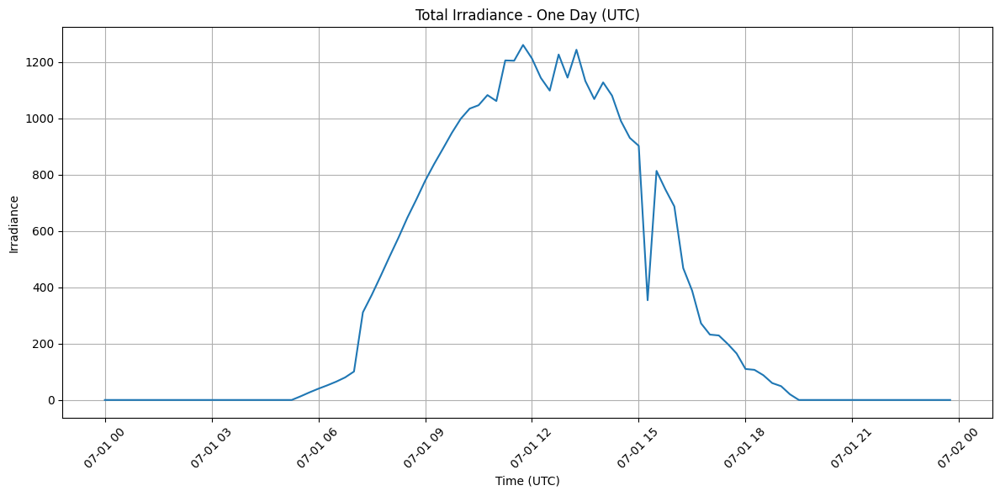

In [14]:
import matplotlib.pyplot as plt

# Select one day of data

# 24 hours * (60 mins / 15 mins) = 96 records
day_data = station07_df.iloc[:96]

plt.figure(figsize=(12, 6))
plt.plot(day_data.index, day_data['lmd_totalirrad'])

# Formatting the plot
plt.title("Total Irradiance - One Day (UTC)")
plt.xlabel("Time (UTC)")
plt.ylabel("Irradiance")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [8]:
station07_df.columns

Index(['nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature', 'nwp_humidity',
       'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure', 'lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure',
       'lmd_winddirection', 'lmd_windspeed', 'power', 'GHI_clr', 'K_CS_day',
       'K_CS_dayNight', 'K_CS', 'P_CLR', 'K_PV', 'sun_elevation',
       'NWP_Power_MW', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos',
       'month_sin', 'month_cos', 'season_sin', 'season_cos'],
      dtype='object')

In [15]:
# ==============================================================================
# CELL 1: Import the Physics-Residual Mamba Module
# ==============================================================================
import sys
sys.path.insert(0, '/home/muhammadhassan/App_v02/physics_informed_inves/PINNS')

from physics_residual_mamba import (
    PhysicsResidualMamba,
    PhysicsResidualMambaConfigs,
    PhysicsPVLoss,
    FeatureScaler,
    compute_scaler_stats,
    run_physics_residual_cv,
    prepare_rolling_folds as prepare_rolling_folds_physics
)

print("✓ Physics-Residual Mamba module imported successfully")

✓ Physics-Residual Mamba module imported successfully


In [16]:
# ==============================================================================
# CELL 3: Configure Models for Comparison
# ==============================================================================

class BaseMambaConfigs:
    """Configuration for base Power Mamba (no physics)."""
    def __init__(self):
        self.seq_len = 960
        self.pred_len = 96
        
        self.TARGET_COL = ['power'] 
        
        self.PAST_INPUT_COLS = ['lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure', 'nwp_globalirrad',
            'nwp_temperature',
            'nwp_windspeed', 'power', 'K_PV', 'NWP_Power_MW', 'hour_sin',
       'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
       'season_sin', 'season_cos'
        ]
        
        self.FUTURE_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin',
       'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
       'season_sin', 'season_cos']
        
        self.common_features = [f for f in self.FUTURE_INPUT_COLS if f in self.PAST_INPUT_COLS]
        self.num_shadows = len(self.common_features)
        self.include_pred = 1
        self.enc_in = len(self.PAST_INPUT_COLS) + self.num_shadows
        self.c_out = 1
        
        # Model hyperparameters
        self.kernel_size = 25
        self.n_embed = 128
        self.d_state = 64
        self.dconv = 2
        self.e_fact = 2 
        self.dropout = 0.2
        
        # Training
        self.n_splits = 4
        self.batch_size = 128
        self.epochs = 5
        
        # Device
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



----

=== BENCHMARK START ===

TRAINING BASE MAMBA | Folds: 4
DEBUG: prepare_rolling_folds - X_raw shape: (32928, 29), n_splits=4
DEBUG: Common Features (Bf): 10 ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'season_sin', 'season_cos']
DEBUG: Generator entering Fold 1 loop...
Fold 1: Filtered 53 night/invalid samples. Training on 6344 samples.
  Fold 1/4... Done. RMSE=2.0417
DEBUG: Generator entering Fold 2 loop...
Fold 2: Filtered 53 night/invalid samples. Training on 12929 samples.
  Fold 2/4... Done. RMSE=1.8443
DEBUG: Generator entering Fold 3 loop...
Fold 3: Filtered 53 night/invalid samples. Training on 19514 samples.
  Fold 3/4... Done. RMSE=1.9070
DEBUG: Generator entering Fold 4 loop...
Fold 4: Filtered 53 night/invalid samples. Training on 26099 samples.
  Fold 4/4...

/home/muhammadhassan/App_v02/physics_informed_inves/PINNS/physics_residual_mamba.py:1103: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt(np.nanmean((preds_flat - actuals_flat) ** 2))
/home/muhammadhassan/App_v02/physics_informed_inves/PINNS/physics_residual_mamba.py:1104: RuntimeWarning: Mean of empty slice
  mae = np.nanmean(np.abs(preds_flat - actuals_flat))


 Done. RMSE=nan

TRAINING PHYSICS (BENCHMARK) | Folds: 4
DEBUG: prepare_rolling_folds - X_raw shape: (32928, 29), n_splits=4
DEBUG: Common Features (Bf): 10 ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'season_sin', 'season_cos']
DEBUG: Generator entering Fold 1 loop...
Fold 1: Filtered 53 night/invalid samples. Training on 6344 samples.
  Fold 1... [Ep1 WARMUP: L=27.8365 Val=18.0054 *New Best*] [Ep2 WARMUP: L=17.5668 Val=6.2086 *New Best*] [Ep3 WARMUP: L=12.5519 Val=3.8065 *New Best*] [Ep5 WARMUP: L=12.0782 Val=3.9903]
[WARMUP COMPLETE] Learned Params: Eta=0.796, U0=4.38
 [Ep10 JOINT: L=4.8726 Val=4.7486]
Example early stopping triggered at epoch 10

Reloading Best Model (RMSE=1.3282)...
 Done. RMSE=1.3282 SP=9.7453
DEBUG: Generator entering Fold 2 loop...
Fold 2: Filtered 53 night/invalid samples. Training on 12929 samples.
  Fold 2... [Ep1 WARMUP: L=20.6844 Val=6.2147 *New Best*] [Ep2 WARMUP: L=8.3823 Val=3.953

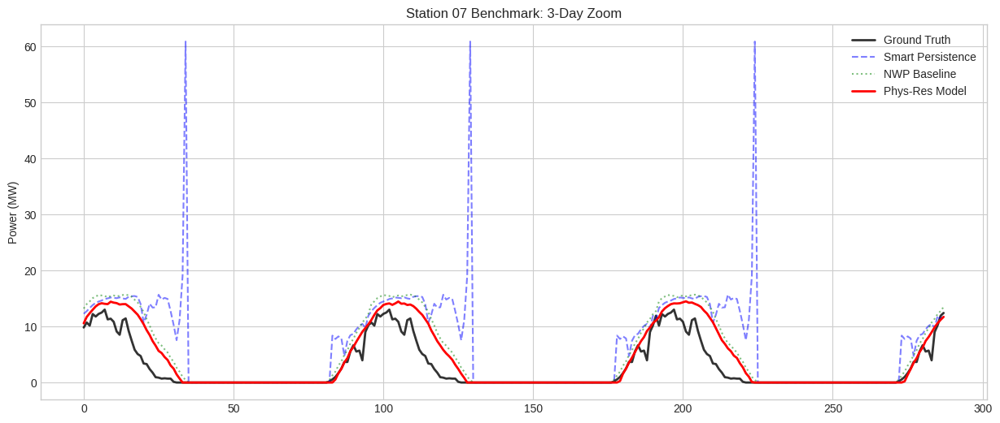

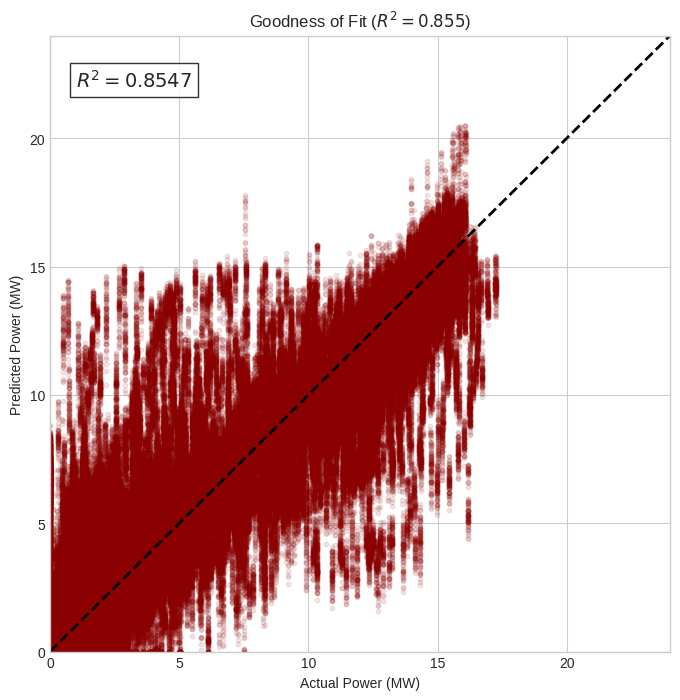

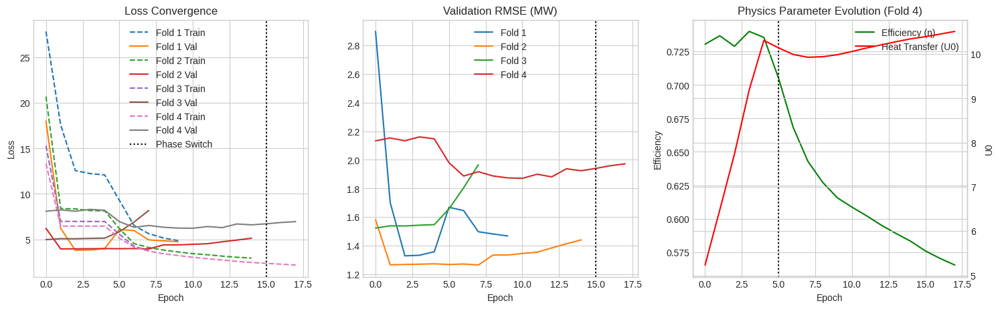

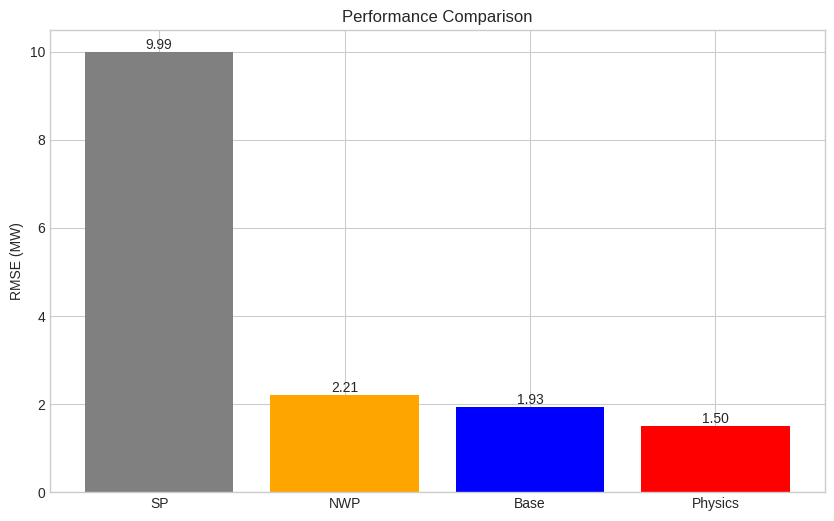

In [13]:
import sys
import importlib
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Reload the library (Important if you just edited it)
import physics_residual_mamba
importlib.reload(physics_residual_mamba)
from physics_residual_mamba import *

# 2. Prepare Data
# Ensure station07_df is loaded from previous cells
df_experiment = station07_df.copy()

n_splits = 4
base_configs = PhysicsResidualMambaConfigs(n_splits=n_splits) 
phys_configs = PhysicsResidualMambaConfigs(n_splits=n_splits)

base_configs.epochs = 50
phys_configs.epochs = 50


configs.experiment_mode = 'v0_base' 
base_results, phys_results = run_full_benchmark(
      df_experiment, 
      base_configs, 
      phys_configs,  
      n_splits=n_splits
)

>>> Running 7-Way Comparative Benchmark (Target: K_PV, Persistent Rolling)
Using Custom Configuration Provided by User
DEBUG: df.index is DatetimeIndex. Range: 2018-07-01 00:00:00+08:00 to 2019-06-13 23:45:00+08:00
DEBUG: Fold 1 - test_index head: DatetimeIndex(['2018-09-07 15:00:00+08:00', '2018-09-07 15:15:00+08:00',
               '2018-09-07 15:30:00+08:00', '2018-09-07 15:45:00+08:00',
               '2018-09-07 16:00:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 1 - test_index tail: DatetimeIndex(['2018-11-15 04:00:00+08:00', '2018-11-15 04:15:00+08:00',
               '2018-11-15 04:30:00+08:00', '2018-11-15 04:45:00+08:00',
               '2018-11-15 05:00:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 1/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2018-09-07 14:45:00+08:00
Test : 2018-09-07 15:00:00+08:00 -> 2018-11-15 05:00:00+08:00
Training Vanilla Mamba... Done.

DEBUG: Fold 2 - test_index head: DatetimeIndex(['2018-11-15 05:15:00+08:00', '2018-11-15 05:30:00+08:00',
               '2018-11-15 05:45:00+08:00', '2018-11-15 06:00:00+08:00',
               '2018-11-15 06:15:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 2 - test_index tail: DatetimeIndex(['2019-01-22 18:15:00+08:00', '2019-01-22 18:30:00+08:00',
               '2019-01-22 18:45:00+08:00', '2019-01-22 19:00:00+08:00',
               '2019-01-22 19:15:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 2/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2018-11-15 05:00:00+08:00
Test : 2018-11-15 05:15:00+08:00 -> 2019-01-22 19:15:00+08:00
Training Vanilla Mamba... Done. RMSE: 1.381 MW | nRMSE: 6.90% | Time: 12.7s
Training Base Power Mamba... Done. RMSE: 1.447 MW | nRMSE: 7.24% | Time: 13.0s
Training Physics V02 (Basic)... Done. RMSE: 1.333 MW | nRMSE: 6.67% | Time: 22.3s
Training 

DEBUG: Fold 3 - test_index head: DatetimeIndex(['2019-01-22 19:30:00+08:00', '2019-01-22 19:45:00+08:00',
               '2019-01-22 20:00:00+08:00', '2019-01-22 20:15:00+08:00',
               '2019-01-22 20:30:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 3 - test_index tail: DatetimeIndex(['2019-04-06 08:30:00+08:00', '2019-04-06 08:45:00+08:00',
               '2019-04-06 09:00:00+08:00', '2019-04-06 09:15:00+08:00',
               '2019-04-06 09:30:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 3/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2019-01-22 19:15:00+08:00
Test : 2019-01-22 19:30:00+08:00 -> 2019-04-06 09:30:00+08:00
Training Vanilla Mamba... Done. RMSE: 1.737 MW | nRMSE: 8.69% | Time: 19.2s
Training Base Power Mamba... Done. RMSE: 1.703 MW | nRMSE: 8.52% | Time: 18.4s
Training Physics V02 (Basic)... Done. RMSE: 1.687 MW | nRMSE: 8.43% | Time: 31.8s
Training 

DEBUG: Fold 4 - test_index head: DatetimeIndex(['2019-04-06 09:45:00+08:00', '2019-04-06 10:00:00+08:00',
               '2019-04-06 10:15:00+08:00', '2019-04-06 10:30:00+08:00',
               '2019-04-06 10:45:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 4 - test_index tail: DatetimeIndex(['2019-06-13 22:45:00+08:00', '2019-06-13 23:00:00+08:00',
               '2019-06-13 23:15:00+08:00', '2019-06-13 23:30:00+08:00',
               '2019-06-13 23:45:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 4/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2019-04-06 09:30:00+08:00
Test : 2019-04-06 09:45:00+08:00 -> 2019-06-13 23:45:00+08:00
Training Vanilla Mamba... Done. RMSE: 2.081 MW | nRMSE: 10.40% | Time: 24.0s
Training Base Power Mamba... Done. RMSE: 2.254 MW | nRMSE: 11.27% | Time: 24.1s
Training Physics V02 (Basic)... Done. RMSE: 2.186 MW | nRMSE: 10.93% | Time: 42.3s
Traini


>>> FINAL RESULTS (Average across folds) <<<
Vanilla Mamba: RMSE=1.723 | nRMSE=8.62%
Base Power Mamba: RMSE=1.776 | nRMSE=8.88%
Physics V02 (Basic): RMSE=1.718 | nRMSE=8.59%
Physics V03 (Geo): RMSE=1.804 | nRMSE=9.02%
Physics V04 (Robust): RMSE=1.671 | nRMSE=8.35%
Smart Persistence: RMSE=2.283 | nRMSE=11.41%
NWP Baseline: RMSE=2.215 | nRMSE=11.07%
Physics Pure: RMSE=1.757 | nRMSE=8.78%


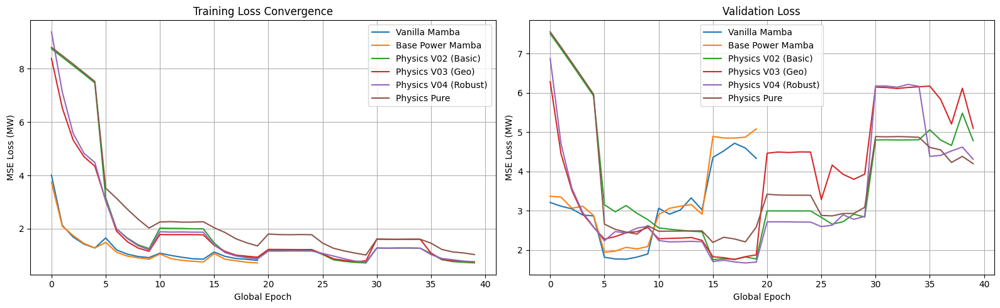

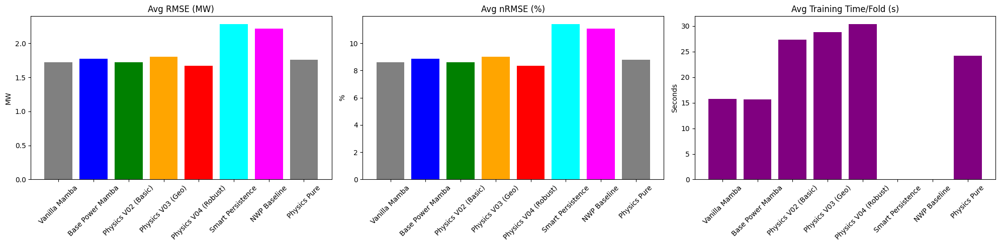

In [23]:
# ==============================================================================
# CELL 3: Configure Models for Comparison
# ==============================================================================

class BaseMambaConfigs:
    """Configuration for base Power Mamba (no physics)."""
    def __init__(self):
        self.seq_len = 288
        self.pred_len = 96
        
        self.TARGET_COL = ['K_PV'] 
        
        self.PAST_INPUT_COLS = ['lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'nwp_globalirrad',
            'nwp_temperature','P_CLR', 
            'nwp_windspeed', 'power', 'K_PV', 'hour_sin',
       'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
       'season_sin', 'season_cos', 'NWP_Power_MW'
        ]
        
        self.FUTURE_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'hour_sin',
       'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos','NWP_Power_MW',
       'season_sin', 'season_cos']
        
        self.common_features = [f for f in self.FUTURE_INPUT_COLS if f in self.PAST_INPUT_COLS]
        self.num_shadows = len(self.common_features)
        self.include_pred = 1
        self.enc_in = len(self.PAST_INPUT_COLS) + self.num_shadows
        self.c_out = 1
        
        # Model hyperparameters
        self.kernel_size = 25
        self.n_embed = 128
        self.d_state = 64
        self.dconv = 2
        self.e_fact = 2 
        self.dropout = 0.2 
        
        # Training
        self.n_splits = 4
        self.batch_size = 32
        self.epochs = 5
        
        # Device
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Run Comparative Benchmark
# This will:
# 1. Train the V0 Model (Target=Power)
# 2. Train the V02 Model (Target=K_PV)
# 3. Report RMSE (MW) for both on the same data splits
# 4. Print the % improvement
  
import physics_residual_mamba_v02 as v02


# Instantiate your config
my_config = BaseMambaConfigs()
my_config.epochs = 100  # Override as needed
# Run benchmark with your config

my_config.warmup_epochs = 50
df_experiment = station07_df.copy()
results = v02.run_comparative_benchmark(
    df_experiment, 
    n_splits=4, 
    custom_config=my_config
)

---

In [ ]:
import pandas as pd
import os
import physics_residual_mamba_v03 as v03

# 1. Setup Paths
abs_path = os.path.abspath("/home/muhammadhassan/App_v02/physics_informed_inves/PVODdatasets_v1")
metadata_path = os.path.join(abs_path, "metadata.csv")
station07_path = os.path.join(abs_path, "station07.csv")
station08_path = os.path.join(abs_path, "station08.csv") # Add Station 08

# 2. Load Metadata
metaData = pd.read_csv(metadata_path)

# 3. Process Station 07 (Target)
station07_data = pd.read_csv(station07_path)
meta_s7 = v03.get_station_metadata(7, metaData) # Use 'metaData' here
df_s7 = v03.calculate_clearsky_indices(meta_s7, station07_data)
# 2. Add NWP Baseline (NWP_Power_MW)
df_s7 = calculate_nwp_power(meta_s7, df_s7) # <--- Use your function

# 3. Add Time Features (hour_sin, ...)
df_s7 = prepare_features(df_s7) # <--- Use your function
# 4. Add Rolling Stats
cols_roll = ["power", "lmd_totalirrad", "lmd_temperature", "lmd_windspeed"]
df_s7 = add_past_rolling_stats(
    df_s7, hours_list=[3,5,8], cols=cols_roll, freq_minutes=15, time_col='date_time'
)



# 4. Process Station 08 (Neighbor)
station08_data = pd.read_csv(station08_path)
meta_s8 = v03.get_station_metadata(8, metaData)
df_s8 = v03.calculate_clearsky_indices(meta_s8, station08_data)

# 5. Merge
df_spatial = v03.merge_stations(df_s7, df_s8)

--- Processing station07 Physics ---
--- Calculating NWP Physical Power for station07 ---
Running ModelChain with NWP Weather...
Done. Mean Predicted Power: 3.2083 MW
--- Processing station08 Physics ---


/tmp/ipykernel_7511/2366004713.py:63: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_7511/2366004713.py:64: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_7511/2366004713.py:63: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_7511/2366004713.py:64: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_7511/2366004713.py:63: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_7511/2366004713.py:64: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_7511/2366004713.py:63: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_7511/2366004713.py:

Merging spatial data...
Original Target Shape: (32928, 51)
Original Neighbor Shape: (33120, 18)
Merged Shape: (32640, 69)


In [20]:
station08_data.columns

Index(['nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature', 'nwp_humidity',
       'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure', 'lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure',
       'lmd_winddirection', 'lmd_windspeed', 'power', 'GHI_clr', 'K_CS',
       'P_CLR', 'K_PV'],
      dtype='object')

In [21]:
# ==============================================================================
# CELL: Run V04 Robust Benchmark
# ==============================================================================
import physics_residual_mamba_v04_robust as v04_robust
import physics_residual_mamba_v03 as v03

# Ensure metadata is loaded
meta_s7 = v03.get_station_metadata(7, metaData)
meta_s8 = v03.get_station_metadata(8, metaData)

# Define the columns (from your config class)
past_cols = [
    'lmd_totalirrad', 'lmd_diffuseirrad', 'lmd_temperature', 'nwp_globalirrad',
    'nwp_temperature', 'P_CLR', 'nwp_windspeed', 'power', 'K_PV', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
    'season_sin', 'season_cos', 'NWP_Power_MW'
]

neighbor_cols = [
    'lmd_totalirrad_s8', 'lmd_temperature_s8', 'nwp_globalirrad_s8',
    'nwp_temperature_s8', 'nwp_windspeed_s8', 'power_s8', 'K_PV_s8', 'P_CLR_s8'
]

# Update config with your columns
my_config.PAST_INPUT_COLS = past_cols

# Run the benchmark
# results = v04_robust.run_robust_benchmark(
#     df_spatial, 
#     meta_s7, 
#     meta_s8, 
#     target_cols=past_cols, 
#     neighbor_cols=neighbor_cols, 
#     custom_config=my_config
#)

----

In [22]:
import physics_residual_mamba_v04_robust as v04_robust

# Define columns
past_cols = [
    'lmd_totalirrad', 'lmd_diffuseirrad', 'lmd_temperature', 'nwp_globalirrad',
    'nwp_temperature', 'P_CLR', 'nwp_windspeed', 'power', 'K_PV', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
    'season_sin', 'season_cos', 'NWP_Power_MW'
]

future_cols = [
    'nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
    'NWP_Power_MW', 'season_sin', 'season_cos'
]

neighbor_cols = [
    'lmd_totalirrad_s8', 'lmd_temperature_s8', 'nwp_globalirrad_s8',
    'nwp_temperature_s8', 'nwp_windspeed_s8', 'power_s8', 'K_PV_s8', 'P_CLR_s8'
]

# Run full comparison
import physics_residual_mamba_v04_robust as v04_robust
import importlib
importlib.reload(v04_robust)

#results, avg_metrics = v04_robust.run_full_comparison_benchmark(
#    df_spatial, meta_s7, meta_s8,
#    target_cols=past_cols,
#    future_cols=future_cols,
#    neighbor_cols=neighbor_cols,
#    custom_config=my_config
#)

<module 'physics_residual_mamba_v04_robust' from '/home/muhammadhassan/App_v02/physics_informed_inves/PINNS/physics_residual_mamba_v04_robust.py'>

---

In [23]:

# Define columns
past_cols = [
    'lmd_totalirrad', 'lmd_diffuseirrad', 'lmd_temperature', 'nwp_globalirrad',
    'nwp_temperature', 'P_CLR', 'nwp_windspeed', 'power', 'K_PV', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
    'season_sin', 'season_cos', 'NWP_Power_MW'
]

future_cols = [
    'nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 
    'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
    'NWP_Power_MW', 'season_sin', 'season_cos'
]

neighbor_cols = [
    'lmd_totalirrad_s8', 'lmd_temperature_s8', 'nwp_globalirrad_s8',
    'nwp_temperature_s8', 'nwp_windspeed_s8', 'power_s8', 'K_PV_s8', 'P_CLR_s8'
]
import physics_residual_mamba_v05_advection as v05_adv

results, avg_metrics = v05_adv.run_advection_benchmark(
    df_spatial, meta_s7, meta_s8,
    target_cols=past_cols,
    neighbor_cols=neighbor_cols,
    future_cols=future_cols,
    custom_config=my_config
)

>>> Running V05 Advection Benchmark
Preparing Advection Features...

FOLD 1
[1] Smart Persistence
 SP RMSE: 2.108
[2] NWP
 NWP RMSE: 1.986
[3] Base Power Mamba (Training)
 Ep 0 [base]: Valid RMSE=1.590 (Best=1.590)
 Ep 5 [base]: Valid RMSE=1.658 (Best=1.590)
 Ep 10 [base]: Valid RMSE=1.663 (Best=1.590)
 Ep 15 [base]: Valid RMSE=1.749 (Best=1.590)
 Early Stopping.
[4] Vanilla Mamba (Training)
 Ep 0 [v02]: Valid RMSE=1.620 (Best=1.620)
 Ep 5 [v02]: Valid RMSE=1.789 (Best=1.620)
 Ep 10 [v02]: Valid RMSE=2.009 (Best=1.620)
 Ep 15 [v02]: Valid RMSE=2.138 (Best=1.620)
 Early Stopping.
[4] V04 Fluid (Simulated)
 V04 Fluid: Skipped (Data Compatibility)
[6] V05 Advection (Training)
 Ep 0 [v05]: Valid RMSE=1.801 (Best=1.801)
 Ep 5 [v05]: Valid RMSE=1.807 (Best=1.767)
 Ep 10 [v05]: Valid RMSE=1.856 (Best=1.657)
 Ep 15 [v05]: Valid RMSE=2.075 (Best=1.657)
 Ep 20 [v05]: Valid RMSE=2.012 (Best=1.657)
 Early Stopping.

FOLD 2
[1] Smart Persistence
 SP RMSE: 1.844
[2] NWP
 NWP RMSE: 2.324
[3] Base Pow